In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
%matplotlib inline

pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

In [4]:
train_a = pd.read_parquet('A/train_targets.parquet')
train_b = pd.read_parquet('B/train_targets.parquet')
train_c = pd.read_parquet('C/train_targets.parquet')

In [5]:
train_a

,time,pv_measurement
0,2019-06-02 22:00:00,0.00
1,2019-06-02 23:00:00,0.00
2,2019-06-03 00:00:00,0.00
3,2019-06-03 01:00:00,0.00
4,2019-06-03 02:00:00,19.36
...,...,...
34080,2023-04-30 19:00:00,9.02
34081,2023-04-30 20:00:00,0.00
34082,2023-04-30 21:00:00,0.00
34083,2023-04-30 22:00:00,0.00


In [6]:
X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')

In [7]:
X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')

In [8]:
X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')

In [9]:
[X_train_estimated_a, X_train_estimated_b, X_train_estimated_c]
keys = [1, 2, 3]

In [10]:
frames_train_estimated = [X_train_estimated_a, X_train_estimated_b, X_train_estimated_c]
X_train_estimated = pd.concat(frames_train_estimated, keys=keys)
X_train_estimated.reset_index(level=0, inplace=True, names='location')

frames_train_observed = [X_train_observed_a, X_train_observed_b, X_train_observed_c]
X_train_observed = pd.concat(frames_train_observed, keys=keys)
X_train_observed.reset_index(level=0, inplace=True, names='location')

frames_test_estimated = [X_test_estimated_a, X_test_estimated_b, X_test_estimated_c]
X_test_estimated = pd.concat(frames_test_estimated, keys=keys)
X_test_estimated.reset_index(level=0, inplace=True, names='location')

In [11]:
X_train_estimated_merged = pd.concat(frames_train_estimated, axis=1)
X_train_estimated_merged.reset_index(drop=True, inplace=True)

X_train_observed_merged = pd.concat(frames_train_observed, axis=1)
X_train_observed_merged.reset_index(drop=True, inplace=True)

X_test_estimated_merged = pd.concat(frames_test_estimated, axis=1)
X_test_estimated_merged.reset_index(drop=True, inplace=True)

In [12]:
X_train_estimated_merged = pd.concat(frames_train_estimated, axis=1)
X_train_estimated_merged.reset_index(drop=True, inplace=True)

X_train_observed_merged = pd.concat(frames_train_observed, axis=1)
X_train_observed_merged.reset_index(drop=True, inplace=True)

X_test_estimated_merged = pd.concat(frames_test_estimated, axis=1)
X_test_estimated_merged.reset_index(drop=True, inplace=True)

In [13]:
X_train_estimated_merged.shape, X_train_observed_merged.shape, X_test_estimated_merged.shape

((17576, 141), (118669, 138), (2880, 141))

In [14]:
frames = [[X_train_estimated_a, train_a], [X_train_observed_a, train_a.dropna()]]
X_train_observed_merged_result = pd.concat(frames[1], axis=0)
X_train_observed_merged_result.reset_index(drop=True, inplace=True)

In [16]:
def build_corr_matrix(data_frames, figsize=(20,20), annot=True):
    plt.figure(figsize=figsize)
    sns.heatmap(data_frames.corr(method='pearson'), annot=annot, cmap=plt.cm.Reds)

### 1. X train estimated

On regarde la matrice de corrélation de \[X_train_estimated_abc\]:

On obtient grossièrement la même matrice pour aa, ab, ac, bb, bc

In [17]:
build_corr_matrix(X_train_estimated_merged, figsize=(100,100), annot=True)

In [18]:
X_test_estimated.keys()

Index(['location', 'date_calc', 'date_forecast', 'absolute_humidity_2m:gm3',
       'air_density_2m:kgm3', 'ceiling_height_agl:m', 'clear_sky_energy_1h:J',
       'clear_sky_rad:W', 'cloud_base_agl:m', 'dew_or_rime:idx',
       'dew_point_2m:K', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W',
       'direct_rad_1h:J', 'effective_cloud_cover:p', 'elevation:m',
       'fresh_snow_12h:cm', 'fresh_snow_1h:cm', 'fresh_snow_24h:cm',
       'fresh_snow_3h:cm', 'fresh_snow_6h:cm', 'is_day:idx',
       'is_in_shadow:idx', 'msl_pressure:hPa', 'precip_5min:mm',
       'precip_type_5min:idx', 'pressure_100m:hPa', 'pressure_50m:hPa',
       'prob_rime:p', 'rain_water:kgm2', 'relative_humidity_1000hPa:p',
       'sfc_pressure:hPa', 'snow_density:kgm3', 'snow_depth:cm',
       'snow_drift:idx', 'snow_melt_10min:mm', 'snow_water:kgm2',
       'sun_azimuth:d', 'sun_elevation:d', 'super_cooled_liquid_water:kgm2',
       't_1000hPa:K', 'total_cloud_cover:p', 'visibility:m',
       'wind_speed_10m:ms

On voit que la localisation est corrélée à 79 % ( .89 * .89 ) à la hauteur de la mesure -> logique et cohérent avec le dernier résultat
Sinon elle n'est corrélée à aucune autre variable à priori

Cette matrice de corrélation est par contre un peu différente de celles qui sont prises localisation par localisation (suite):

Mais on peut regrouper les variables fortement corrélées:

- date_calc, date_forecast: logique
- date_calc, absolute_humidity_2m:gm3: $\sim 60\%$
- date_calc, air_density_2m:kgm3: $\sim 50\%$
- date_calc, dew_point_2m: 
- dew_point_2m, absolute_humidity_2m:gm3: $\sim 98\%$ (point de rosée)
- 



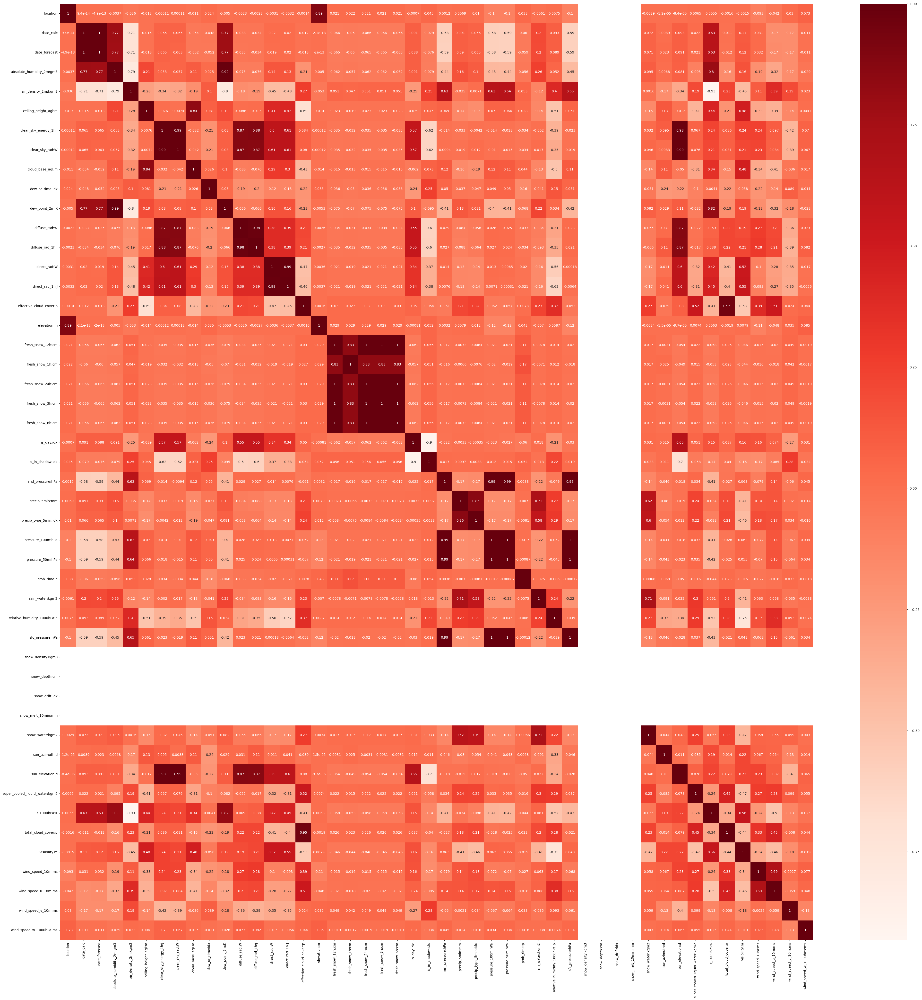

In [19]:
build_corr_matrix(X_test_estimated, figsize=(50,50))

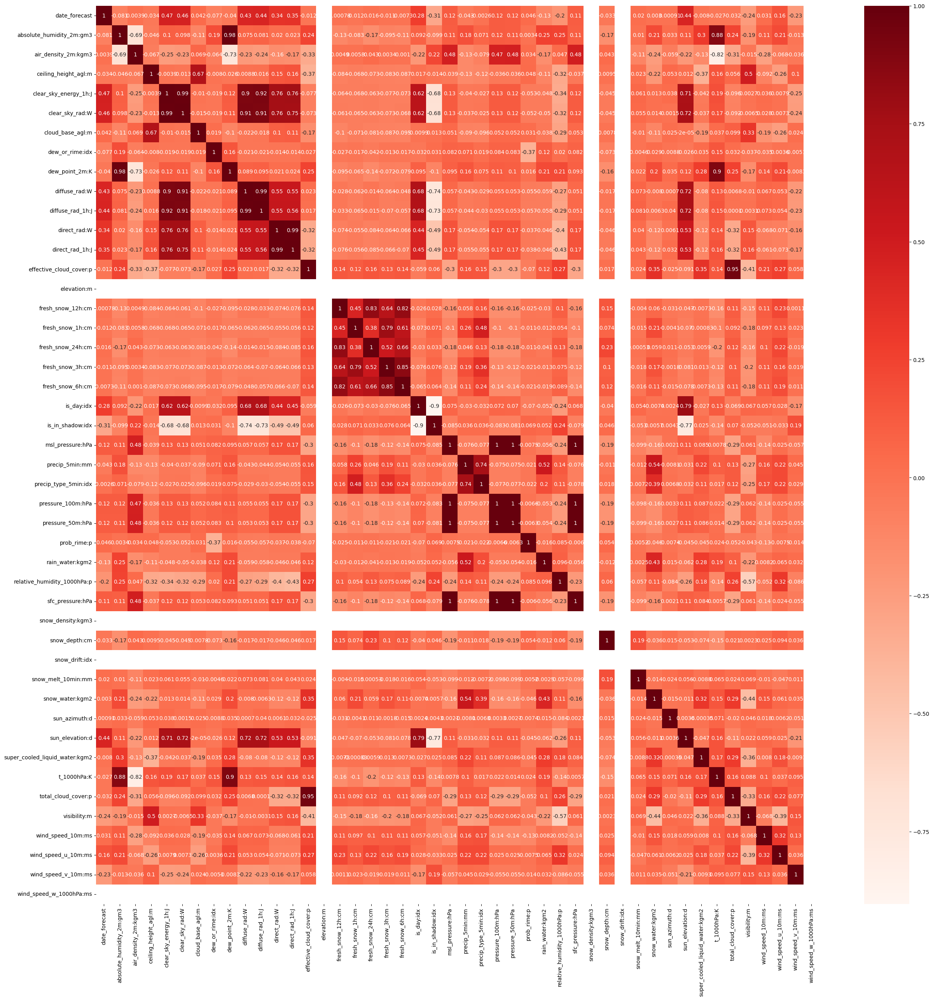

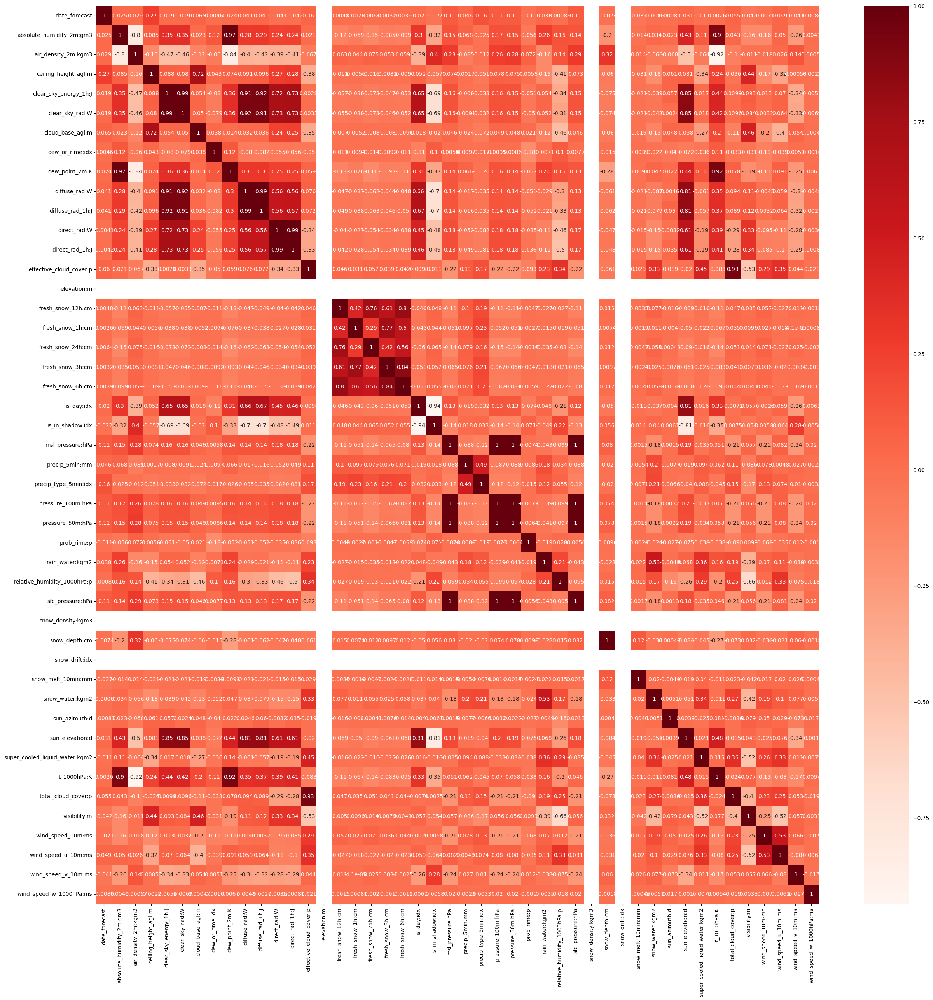

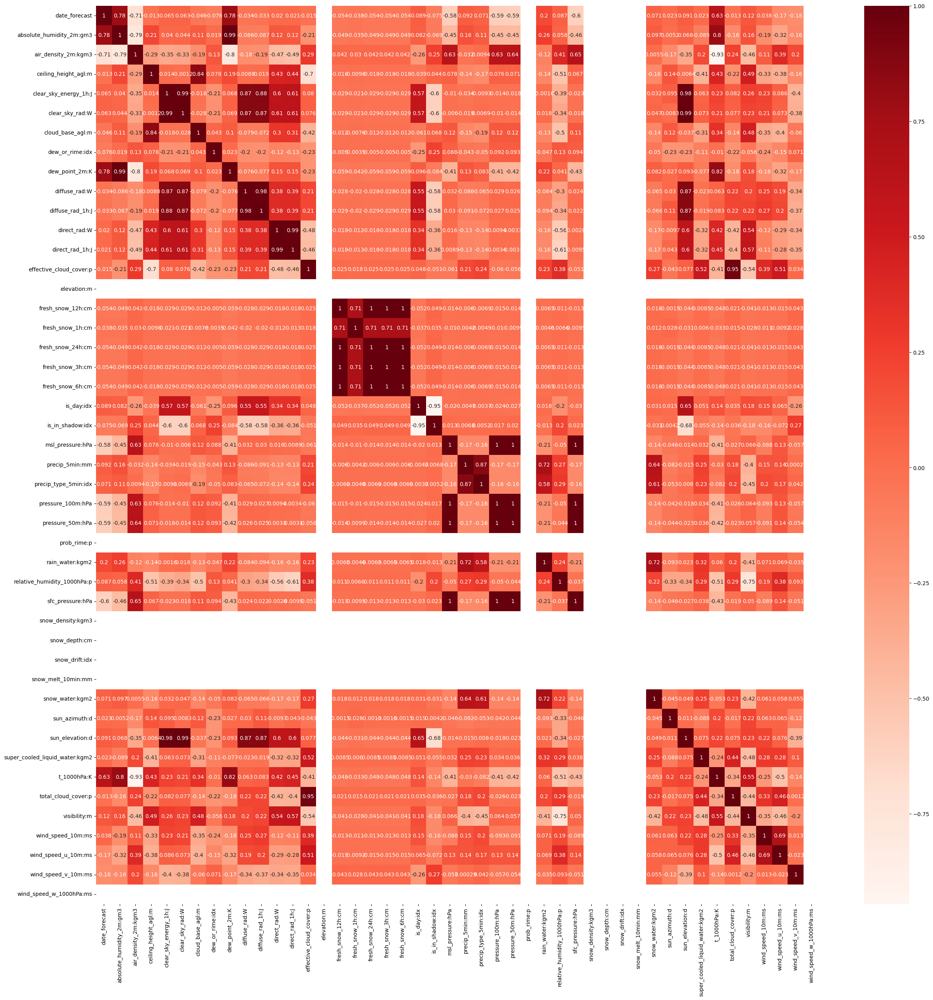

In [20]:
for frame in frames_train_estimated:
    build_corr_matrix(frame, figsize=(30,30))

### 2. X train observed

In [ ]:
frames_train_estimated = [X_train_estimated_a.drop(columns=["date_calc"]), X_train_observed_a, X_test_estimated_a.drop(columns=["date_calc"])]
X_frames_a = pd.concat(frames_train_estimated, keys=keys)
X_frames_a.reset_index(level=0, inplace=True, names='frame_type')

train_a = train_a.rename(columns={'time': 'date_forecast'})
X_y_a = X_frames_a.merge(train_a, on='date_forecast', how='inner')
X_y_a.reset_index(drop=True, inplace=True)

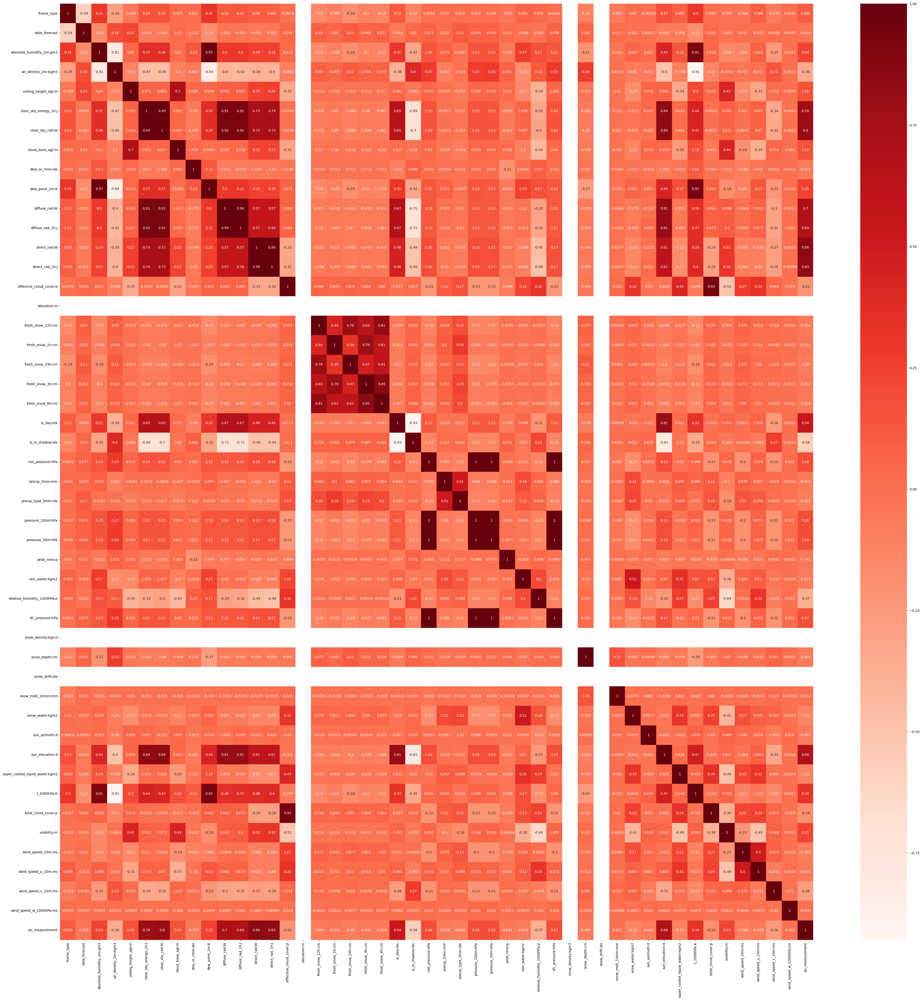

In [21]:
build_corr_matrix(X_y_a, figsize=(50,50))

Ce qui est le plus corrélé pour pv_measurement:

- clear_sky_energy_1h:J: clear sky energy of previous time period, available up to 24h [J/m2]
- clear_sky_rad:W: clear sky radiation flux [W/m2]
- diffuse_rad:W: diffuse radiation flux [W/m2]
- diffuse_rad_1h:J: 
- direct_rad:W: direct radiation flux [W/m2]

### 3. X test estimated

In [55]:
frames_train_estimated = [X_train_estimated_b.drop(columns=["date_calc"]), X_train_observed_b, X_test_estimated_b.drop(columns=["date_calc"])]
X_frames_b = pd.concat(frames_train_estimated, keys=keys)
X_frames_b.reset_index(level=0, inplace=True, names='frame_type')

train_b = train_b.rename(columns={'time': 'date_forecast'})
X_y_b = X_frames_b.merge(train_b.dropna(), on='date_forecast', how='inner')
X_y_b.reset_index(drop=True, inplace=True)

frames_train_estimated = [X_train_estimated_c.drop(columns=["date_calc"]), X_train_observed_c, X_test_estimated_c.drop(columns=["date_calc"])]
X_frames_c = pd.concat(frames_train_estimated, keys=keys)
X_frames_c.reset_index(level=0, inplace=True, names='frame_type')

train_c = train_c.rename(columns={'time': 'date_forecast'})
X_y_c = X_frames_c.merge(train_c.dropna(), on='date_forecast', how='inner')
X_y_c.reset_index(drop=True, inplace=True)

frames_location= [X_y_a, X_y_b, X_y_c]
X_y = pd.concat(frames_location, keys=keys)
X_y.reset_index(level=0, inplace=True, names='location')
X_y

,location,frame_type,date_forecast,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,pv_measurement
0,1,1,2022-10-28 22:00:00,8.4,1.233,1425.099976,0.000000,0.000000,1211.699951,1.0,281.399994,0.000000,0.000000,0.0,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1001.099976,0.00,0.0,988.500000,994.500000,0.0,0.0,92.699997,1000.599976,NaN,0.0,0.0,-0.0,0.4,340.799011,-38.466999,0.0,284.700012,100.000000,29429.699219,0.8,-0.4,0.7,-0.0,0.0
1,1,1,2022-10-28 23:00:00,8.2,1.233,4068.199951,0.000000,0.000000,2607.000000,1.0,281.100006,0.000000,0.000000,0.0,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,999.799988,0.00,0.0,987.299988,993.299988,0.0,0.1,92.599998,999.299988,NaN,0.0,0.0,-0.0,0.6,359.638000,-39.609001,0.0,284.600006,100.000000,6254.399902,0.6,-0.1,0.6,-0.0,0.0
2,1,1,2022-10-29 00:00:00,8.2,1.230,1978.000000,0.000000,0.000000,1660.500000,1.0,281.000000,0.000000,0.000000,0.0,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,997.200012,0.08,1.0,984.700012,990.700012,0.0,0.2,89.199997,996.700012,NaN,0.0,0.0,-0.0,1.4,17.361000,-39.013000,0.1,283.700012,100.000000,3041.600098,1.5,1.2,0.8,-0.0,0.0
3,1,1,2022-10-29 01:00:00,8.1,1.229,1722.000000,0.000000,0.000000,1699.300049,1.0,280.899994,0.000000,0.000000,0.0,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,996.500000,0.13,1.0,984.000000,990.000000,0.0,0.2,89.199997,996.000000,NaN,0.0,0.0,-0.0,0.8,35.452000,-36.023998,0.3,284.200012,100.000000,3572.600098,1.5,0.8,1.2,-0.0,0.0
4,1,1,2022-10-29 02:00:00,8.3,1.228,1456.400024,0.000000,0.000000,1294.699951,1.0,281.299988,0.000000,0.000000,0.0,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,996.099976,0.09,1.0,983.599976,989.500000,0.0,0.3,91.800003,995.599976,NaN,0.0,0.0,-0.0,0.9,52.154999,-31.374001,0.2,284.600006,100.000000,2699.199951,1.8,1.3,1.2,-0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26066,3,2,2022-04-25 17:00:00,4.8,1.263,834.400024,889105.875000,181.300003,625.200012,0.0,273.399994,77.099998,371056.187500,22.1,151282.593750,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1019.299988,0.00,0.0,1003.500000,1009.599976,0.0,0.0,68.000000,1015.799988,NaN,0.0,0.0,-0.0,0.0,272.343994,13.531000,0.1,277.600006,100.000000,38154.898438,4.2,3.0,-2.9,0.0,98.0
26067,3,2,2022-04-25 18:00:00,4.8,1.265,1177.599976,436398.906250,66.800003,699.000000,0.0,273.299988,34.099998,200220.500000,6.4,51269.500000,85.699997,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1019.299988,0.01,1.0,1003.500000,1009.700012,0.0,0.0,66.599998,1015.900024,NaN,0.0,0.0,-0.0,0.0,285.618988,6.894000,0.0,277.600006,85.699997,35621.601562,3.6,2.5,-2.6,0.0,39.2
26068,3,2,2022-04-25 19:00:00,4.8,1.266,NaN,111474.203125,4.800000,715.299988,0.0,273.299988,4.600000,69705.898438,0.0,11484.099609,48.799999,24.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1019.500000,0.00,0.0,1003.700012,1009.900024,0.0,0.0,67.099998,1016.099976,NaN,0.0,0.0,-0.0,0.0,298.915009,0.674000,0.0,277.600006,48.799999,37843.800781,3.1,2.4,-1.9,0.0,0.0
26069,3,2,2022-04-25 20:00:00,5.0,1.274,NaN,1336.400024,0.000000,548.900024,0.0,273.899994,0.000000,8255.700195,0.0,0.000000,55.599998,24.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1019.79

In [56]:
X_y.shape, train_a.dropna().shape, train_b.shape, train_b.dropna().shape, train_c.shape, train_c.dropna().shape, 

((92951, 49), (34085, 2), (32848, 2), (32844, 2), (32155, 2), (26095, 2))

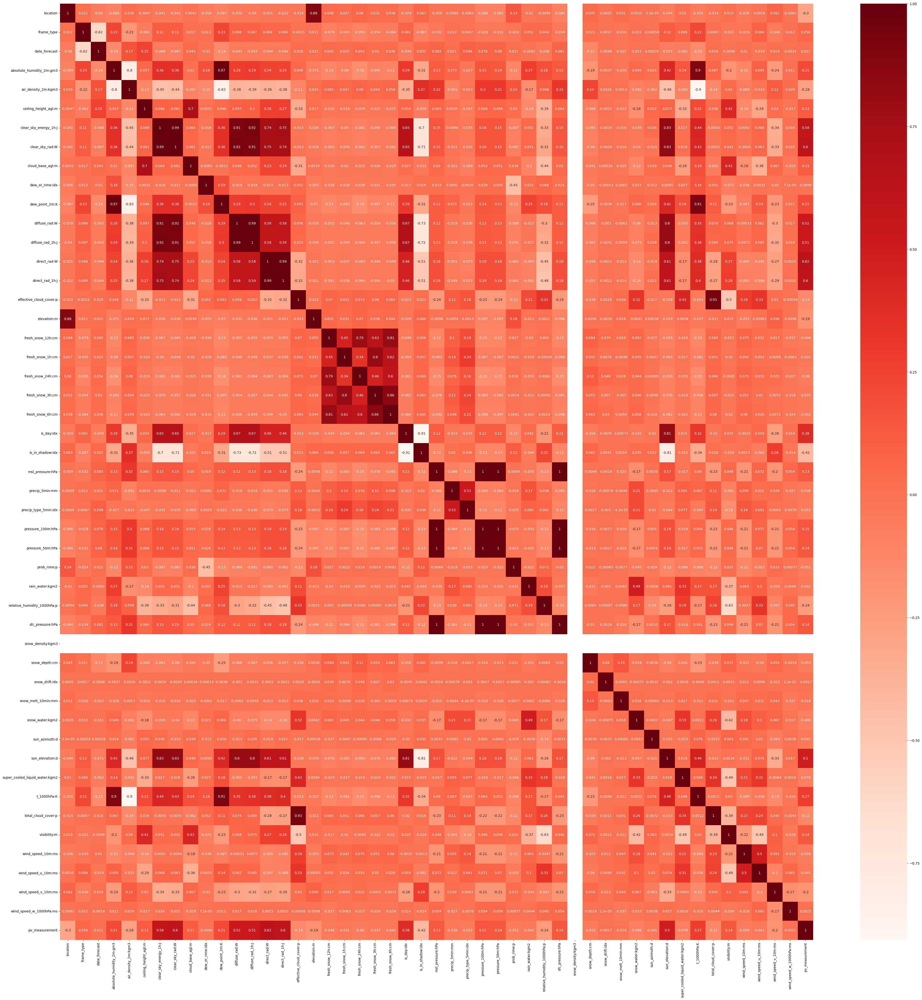

In [57]:
build_corr_matrix(X_y, figsize=(50,50))

Ça colle avec le dernier résultat mais les coeff de corrélations sont plus faible lorsque l'on regarde sur les trois localisations. Mais la localisation semble pas impacter le résultat.